In [200]:
#!pip install catboost
#!pip install xgboost

In [453]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from datetime import date
import requests
from itertools import combinations
from scipy.stats import pearsonr, chi2_contingency
from scipy.stats import poisson
from catboost import Pool, CatBoostClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, precision_recall_curve, roc_curve
from sklearn import preprocessing
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from mpl_toolkits.mplot3d import Axes3D
from sklearn.model_selection import GridSearchCV
import seaborn as sns
sns.set()

In [384]:
#load data from sportsdatabase.com
nbastats = pd.read_csv('nba_stats_05-19.csv')

In [385]:
#make a matchup column where each matchup is the same i.e. x vs y and none are y vs x
nbastats['matchup'] = 0

for row, index in zip(nbastats.values, nbastats.index):
    matchup = row[1] + ' ' + row[3]
    matchups = matchup.split(' ')
    matchups.sort()
    matchupz = ' '.join(matchups)
    nbastats['matchup'][index] = matchupz

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [386]:
#make column where >=finalscore-vegasline is 1 and < is 0
nbastats['o/u'] = 0
nbastats.loc[nbastats['o/u margin'] >= 0, 'o/u'] = 1
nbastats.loc[nbastats['o/u margin'] < 0, 'o/u'] = 0

In [387]:
#column for win loss stat
nbastats['WL'] = 0
nbastats.loc[nbastats['points'] > nbastats['op points'], 'WL'] = 1
nbastats.loc[nbastats['points'] < nbastats['op points'], 'WL'] = -1

In [388]:
#convert conference to number
nbastats.loc[nbastats['conference west/east'] == 'Western', 'conference west/east'] = 1
nbastats.loc[nbastats['conference west/east'] == 'Eastern', 'conference west/east'] = 0

In [389]:
#convert home away to number
nbastats.loc[nbastats['home away'] == 'home', 'home away'] = 1
nbastats.loc[nbastats['home away'] == 'away', 'home away'] = 0

In [390]:
#make column where >=finalscore-vegasline is 1 and < is 0
nbastats['o/u margin class'] = 0

mthresh = 10

nbastats.loc[nbastats['o/u margin'] >= mthresh, 'o/u margin class'] = 1
nbastats.loc[(nbastats['o/u margin'] < mthresh) & 
             (nbastats['o/u margin'] > -mthresh), 'o/u margin class'] = 0
nbastats.loc[nbastats['o/u margin'] <= -mthresh, 'o/u margin class'] = -1

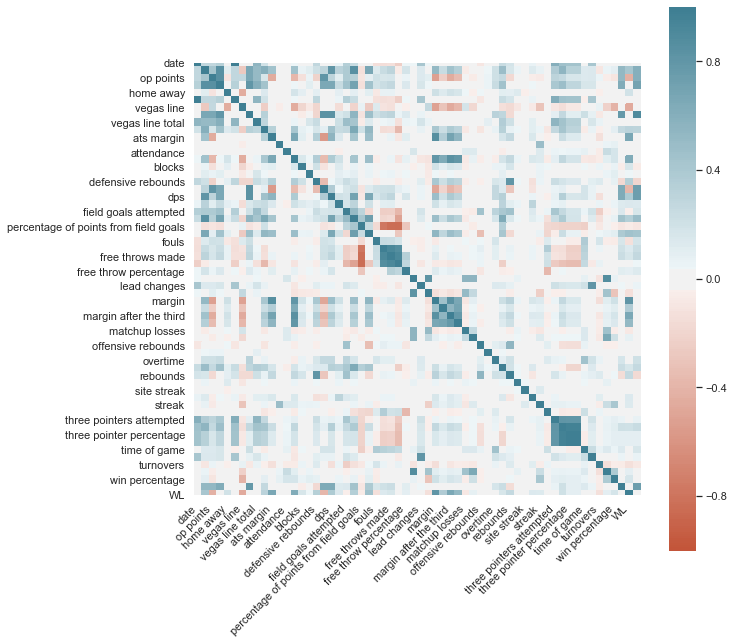

In [391]:
corr = nbastats.corr()
fig, ax = plt.subplots(figsize=(10,10))
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

In [392]:
#onehot the timezone, diision, and day columns
nbastats = pd.get_dummies(nbastats, prefix_sep="__", columns=['time zone', 'division', 'day'])

In [393]:
#drop any nans
#nbastats = nbastats.dropna()
#nbastats = nbastats.reset_index(drop=True)

In [394]:
#percentage of nans
nan_mean = (nbastats.isna().mean() * 100).round(3)
nan_mean = nan_mean[nan_mean != 0].sort_values()
nan_mean

margin after the first                      0.010
overtime                                    0.010
margin at the half                          0.010
margin after the third                      0.010
percentage of points from three pointers    0.026
three pointer percentage                    0.026
three pointers made                         0.026
three pointers attempted                    0.026
steals                                      0.026
rebounds                                    0.026
officials                                   0.026
offensive rebounds                          0.026
free throw percentage                       0.026
assists                                     0.026
free throws made                            0.026
blocks                                      0.026
defensive rebounds                          0.026
percentage of points from free throws       0.026
field goals made                            0.026
percentage of points from field goals       0.026


In [395]:
#fill numerical nans with mean from whole data set, hopefully not too much leakage
#should use means from each season
fill_max = nan_mean.index.values
nbastats[fill_max] = nbastats[fill_max].fillna(nbastats[fill_max].mean())

In [396]:
#fill cat. nans with ['NA']
nbastats['officials'] = nbastats['officials'].fillna('NA')

In [397]:
#remaining categorical columns
cat_feat = nbastats.select_dtypes('object').columns.values
nbastats[cat_feat].nunique().sort_values()

team            31
op team         31
matchup        464
officials    15038
dtype: int64

In [398]:
def highcorrelation(df, thresh):
    num_feat = df.select_dtypes('number').columns.values
    comb_num_feat = np.array(list(combinations(num_feat, 2)))
    corr_num_feat = np.array([])

    for comb in comb_num_feat:
        corr = pearsonr(df[comb[0]], df[comb[1]])[0]
        corr_num_feat = np.append(corr_num_feat, corr)
    high_corr_num = comb_num_feat[np.abs(corr_num_feat) >= thresh]
    return high_corr_num

In [399]:
highcorrelation(nbastats, .8)

array([['date', 'season'],
       ['points', 'total points'],
       ['points', 'dps'],
       ['points', 'field goals made'],
       ['op points', 'total points'],
       ['op points', 'dpa'],
       ['o/u margin', 'dpa'],
       ['o/u margin', 'dps'],
       ['o/u margin', 'o/u margin class'],
       ['ats margin', 'margin'],
       ['biggest lead', 'margin'],
       ['biggest lead', 'margin after the third'],
       ['conference west/east', 'time zone__E'],
       ['defensive rebounds', 'rebounds'],
       ['percentage of points from field goals', 'free throws made'],
       ['percentage of points from field goals',
        'percentage of points from free throws'],
       ['free throws attempted', 'free throws made'],
       ['free throws attempted', 'percentage of points from free throws'],
       ['free throws made', 'percentage of points from free throws'],
       ['game number', 'losses'],
       ['game number', 'wins'],
       ['lead changes', 'times tied'],
       ['margin', '

In [400]:
#drop highly correlated values and make a new df
nbastats = nbastats.drop(['date', 'total points', 'dps', 'field goals made', 'dpa', 
                          'ats margin', 'margin', 'margin after the third', 'time zone__E', 
                          'rebounds', 'percentage of points from field goals', 'free throws attempted',
                          'percentage of points from free throws','game number', 'times tied',
                          'three pointers attempted', 'three pointer percentage',
                          'percentage of points from three pointers'], axis=1, errors='ignore')

In [401]:
nbastats.columns

Index(['team', 'points', 'op team', 'op points', 'home away', 'season',
       'vegas line', 'o/u margin', 'vegas line total', 'assists', 'ats streak',
       'attendance', 'biggest lead', 'blocks', 'conference west/east',
       'defensive rebounds', 'fast break points', 'field goals attempted',
       'field goal percentage', 'fouls', 'free throws made',
       'free throw percentage', 'lead changes', 'losses',
       'margin after the first', 'margin at the half', 'matchup losses',
       'matchup wins', 'offensive rebounds', 'officials', 'ou streak',
       'overtime', 'points in the paint', 'rest', 'site streak', 'steals',
       'streak', 'team rebounds', 'three pointers made', 'time of game',
       'turnovers', 'wins', 'win percentage', 'matchup', 'o/u', 'WL',
       'o/u margin class', 'time zone__C', 'time zone__M', 'time zone__P',
       'division__Atlantic', 'division__Central', 'division__Northwest',
       'division__Pacific', 'division__Southeast', 'division__Southwest',

In [402]:
#ingame/postgame stats
in_game_mask = ['matchup', 'points', 'op points', 'o/u margin', 'assists', 'biggest lead', 'blocks', 
       'defensive rebounds', 'fast break points', 'field goals attempted',
       'field goal percentage', 'fouls', 'free throws made',
       'free throw percentage', 'lead changes','margin after the first', 'margin at the half', 
       'offensive rebounds', 'overtime', 'points in the paint', 'steals',
       'team rebounds', 'three pointers made', 'time of game',
       'turnovers', 'o/u', 'WL', 'o/u margin class']

#pregame stats
ext_game_mask = ['team', 'op team', 'home away', 'season',
       'vegas line', 'vegas line total', 'ats streak',
       'attendance', 'conference west/east',
       'losses', 'matchup losses', 'matchup wins', 'officials', 'ou streak',
       'rest', 'site streak', 'streak', 'wins', 'win percentage', 'matchup',
       'time zone__C', 'time zone__M', 'time zone__P', 'division__Atlantic',
       'division__Central', 'division__Northwest', 'division__Pacific',
       'division__Southeast', 'division__Southwest', 'day__Friday',
       'day__Monday', 'day__Saturday', 'day__Sunday', 'day__Thursday',
       'day__Tuesday', 'day__Wednesday']

In [403]:
#build one data frame ordered by season 05, 06,..19 etc. but after each season add average of ingame/postgame stats
#for cross validation with 05 as train and average of 05 ingame and 06 external stats as test, next 07 ingame as train and
#average of 08 and 09 external for test, like 05<06>, 07<08>...16<17>. As the final untouched test set use 18,<19>. This is to
#preserve the time order of the games
#[05,06,07,08,09,...16]
#[(<05>,06),(<07>,08),(<09>,10),...(<16>,17)]
#concat,concat,concat...
#05(<05>,06) 07(<07>,08) 09(<09>,10)...
X_train = nbastats.copy()
X_test = nbastats.copy()

X_train_set = []
for i in range(2005, 2020):
    X_train_set.append(X_train[X_train['season'] == i])

X_test_set = []
for i in range(2005, 2020):
    X_test_set.append(X_test[X_test['season'] == i])

In [404]:
#average up ingame/postgame stats by matchup in training set to apply to test set's matchups,
#this way we are not using data in the test that would be unknown at the time of placing an
#actual bet pregame
for i in range(1, len(X_test_set)):
    #get averages of previous season
    ma = X_test_set[i-1][in_game_mask]
    matchup_averages = ma.groupby(by='matchup', as_index=True).mean()
    #matchup_averages.reset_index(drop=True, inplace=True)
        
    #impute averages of ingame stats from training set into ingame stat columns in test set
    for j in in_game_mask:
        if j == 'matchup':
            continue    
        for index, row in X_test_set[i].iterrows():
            a = row['matchup']
            if a not in matchup_averages.index:
                continue
            X_test_set[i][j][index] = matchup_averages[j][a]

#in_game_mask.remove('matchup')

#for i in in_game_mask:
#    for index, row in X_test.iterrows():
#        X_test[i][index] = matchup_averages[matchup_averages['matchup'] == row['matchup']][i]

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [459]:
#make concatinated train,test and get indices for each train,test for CV, leave out 2018/2019 for final
#test
X_train = pd.concat(X_train_set, ignore_index=True)
X_test = pd.concat(X_test_set, ignore_index=True)

y_train = X_train['o/u']
y_test = X_test['o/u']

X_train_final = X_train[X_train['season'] == 2018]
X_test_final = X_test[X_test['season'] == 2019]

y_train_final = X_train_final['o/u']
y_test_final = X_test_final['o/u']

indices = list()
for i in range(2005, 2018):
    train = X_train.loc[X_train['season'] == i].index
    test = X_test.loc[X_test['season'] == i+1].index
    indices.append((train, test))


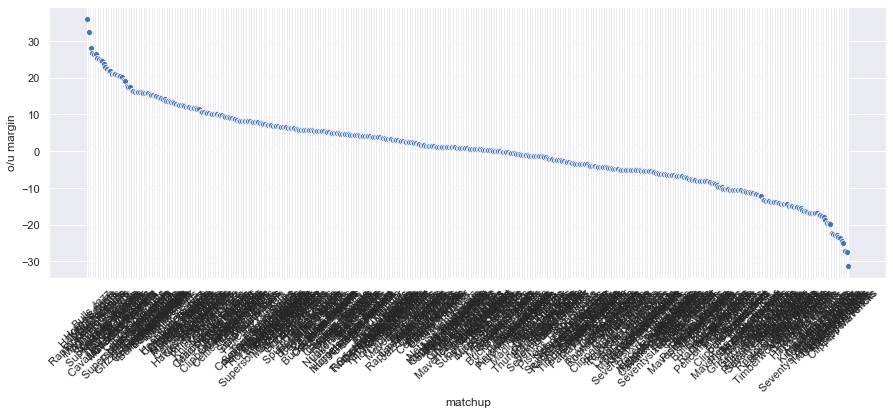

In [460]:
fig, axes = plt.subplots(1,1, figsize=(15,5))
g = sns.scatterplot(x='matchup', y='o/u margin', data=X_test.groupby('matchup', as_index=False).
                    mean().sort_values('o/u margin', ascending=False))
g = plt.xticks(rotation=45)

In [461]:
highcorrelation(X_train, .8)

array([['o/u margin', 'o/u margin class']], dtype='<U22')

In [462]:
highcorrelation(X_test, .8)

C:\Anaconda3\lib\site-packages\ipykernel_launcher.py:9: RuntimeWarning: invalid value encountered in greater_equal
  if __name__ == '__main__':


array([['points', 'op points']], dtype='<U22')

In [463]:
X_train.columns

Index(['team', 'points', 'op team', 'op points', 'home away', 'season',
       'vegas line', 'o/u margin', 'vegas line total', 'assists', 'ats streak',
       'attendance', 'biggest lead', 'blocks', 'conference west/east',
       'defensive rebounds', 'fast break points', 'field goals attempted',
       'field goal percentage', 'fouls', 'free throws made',
       'free throw percentage', 'lead changes', 'losses',
       'margin after the first', 'margin at the half', 'matchup losses',
       'matchup wins', 'offensive rebounds', 'officials', 'ou streak',
       'overtime', 'points in the paint', 'rest', 'site streak', 'steals',
       'streak', 'team rebounds', 'three pointers made', 'time of game',
       'turnovers', 'wins', 'win percentage', 'matchup', 'o/u', 'WL',
       'o/u margin class', 'time zone__C', 'time zone__M', 'time zone__P',
       'division__Atlantic', 'division__Central', 'division__Northwest',
       'division__Pacific', 'division__Southeast', 'division__Southwest',

In [469]:
droplist = ['o/u margin', 'o/u margin class', 'o/u', 'points', 'op points', 'vegas line total']
X_train = X_train.drop(droplist, axis=1, errors='ignore')
X_test = X_test.drop(droplist, axis=1, errors='ignore')
X_train_final = X_train_final.drop(droplist, axis=1, errors='ignore')
X_test_final = X_test_final.drop(droplist, axis=1, errors='ignore')

In [470]:
X_train_num = X_train.select_dtypes('number')
X_test_num = X_test.select_dtypes('number')
X_train_final_num = X_train_final.select_dtypes('number')
X_test_final_num = X_test_final.select_dtypes('number')

In [28]:
from time import time
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import xgboost as xgb
from xgboost import plot_importance

In [27]:
def train_classifier(clf, Xtrain, ytrain):
    start = time()
    clf.fit(Xtrain, ytrain)
    end = time()
    print("Traned model in {:.4f} seconds".format(end - start))


In [28]:
def predict_labels(clf, features, target):
    start = time()
    y_pred = clf.predict(features)
    display(y_pred)
    end = time()
    print("Made predictins in {:.4f} seconds.".format(end - start))
    #return f1_score(target, y_pred, pos_label='o/u'), sum(target == y_pred) / float(len(y_pred))
    return f1_score(target, y_pred, average = None), sum(target == y_pred) / float(len(y_pred))


In [29]:
def train_predict(clf, Xtrain, ytrain, Xtest, ytest):
    #print("Training a {} using a training set size of {}. . ".format(clf._class__._name__,len(X_train)))
    train_classifier(clf, Xtrain, ytrain)
    f1, acc = predict_labels(clf, Xtrain, ytrain)
    print(f1, acc)
    #print("F1 score ad accuacy score for training set: {:.4f} , {:.4f}.".format(str(f1), str(acc)))
    f1, acc = predict_labels(clf, Xtest, ytest)
    print(f1, acc)
    #print("F1 score and acuracy score for test set: {:.4f} , {:.4f}.".format(f1 , acc))

In [30]:
clf_A = LogisticRegression(random_state = 42)
clf_B = SVC(random_state = 912, kernel='rbf')
clf_C = xgb.XGBClassifier(seed = 82)

In [31]:
train_predict(clf_A, X_train.select_dtypes('number'), y_train, X_test.select_dtypes('number'), y_test)

Traned model in 0.1609 seconds


array([0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 0,

Made predictins in 0.0320 seconds.
[0.8986694  0.89320388] 0.8960084033613446


array([1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0,

Made predictins in 0.0350 seconds.
[0.7879397  0.76787679] 0.7783613445378151


In [32]:
train_predict(clf_B, X_train.select_dtypes('number'), y_train, X_test.select_dtypes('number'), y_test)

Traned model in 0.3498 seconds


array([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0,

Made predictins in 0.3048 seconds.
[1. 1.] 1.0


array([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

Made predictins in 0.3528 seconds.
[0.7057971  0.22519084] 0.5735294117647058


In [33]:
train_predict(clf_C, X_train.select_dtypes('number'), y_train, X_test.select_dtypes('number'), y_test)

Traned model in 0.8815 seconds


array([0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0,

Made predictins in 0.0350 seconds.
[1. 1.] 1.0


array([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1,
       0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1,
       1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0,

Made predictins in 0.0690 seconds.
[0.80144404 0.72361809] 0.7689075630252101


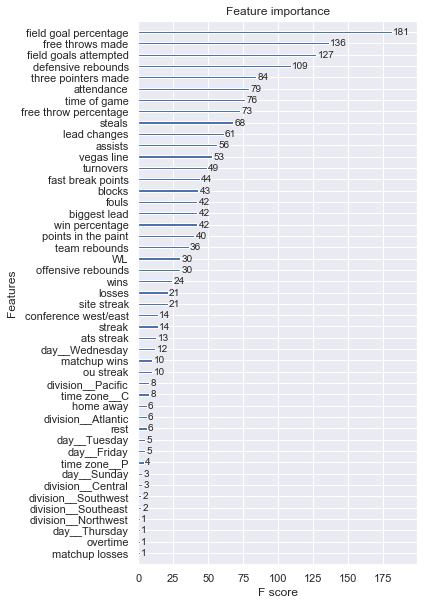

In [34]:
fig, ax = plt.subplots(1, 1, figsize = (5,10))
plot_importance(clf_C, ax=ax)
plt.show()

In [88]:
scaler = StandardScaler()
X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train.select_dtypes('number')), columns = X_train.select_dtypes('number').columns)
y_train_scaled = y_train.reset_index(drop=True)
X_test_scaled = pd.DataFrame(scaler.fit_transform(X_test.select_dtypes('number')), columns = X_train.select_dtypes('number').columns)
y_test_scaled = y_test.reset_index(drop=True)

In [30]:
from sklearn.metrics import log_loss

model = LogisticRegression(random_state = 42)
model.fit(X_train_scaled, y_train)

# make predictions for test data
y_pred = model.predict(X_test_scaled)
predictions = [round(value) for value in y_pred]

# evaluate prediction
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

probas_train = model.predict_proba(X_train_scaled)
log_loss_train = log_loss(y_train, probas_train)
print(log_loss_train)

probas_test = model.predict_proba(X_test_scaled)
log_loss_test = log_loss(y_test, probas_test)
print(log_loss_test)

Accuracy: 78.15%
0.26605067604939503
0.6413690580088817


In [31]:
model = SVC(random_state = 912, kernel='linear')
model.fit(X_train_scaled, y_train)

# make predictions for test data
y_pred = model.predict(X_test_scaled)
predictions = [round(value) for value in y_pred]

# evaluate prediction
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))


Accuracy: 77.52%


[12:56:12] WARNING: C:\Users\Administrator\workspace\xgboost-win64_release_1.1.0\src\learner.cc:480: 
Parameters: { cosample_bytree } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.




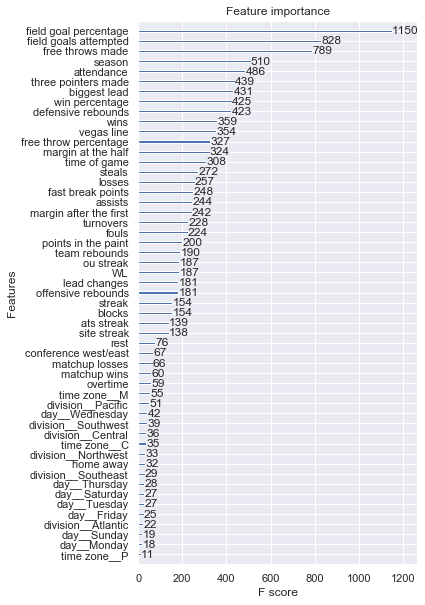

Accuracy: 79.20%


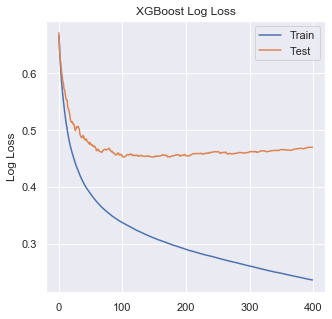

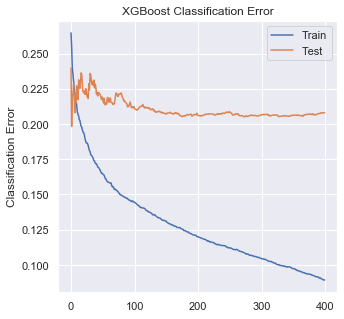

In [471]:
from time import time
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
import xgboost as xgb
from xgboost import plot_importance
from sklearn.metrics import log_loss

model = xgb.XGBClassifier(seed=89, eta=.1, n_estimators=400, min_child_weight=1, 
                          max_depth=5, subsample=.8, cosample_bytree=.8, reg_lambda=1.1, 
                          reg_alpha= 1.1)
evals_result ={}
eval_s = [(X_train_num, y_train),(X_test_num, y_test)]
model.fit(X_train_num, y_train, eval_metric=["error", "logloss"], eval_set=eval_s, verbose=False)

#plot importance
fig, ax = plt.subplots(figsize = (5,10))
plot_importance(model, ax=ax)
plt.show()

# make predictions for test data
y_pred = model.predict(X_test_num)
predictions = [round(value) for value in y_pred]

# evaluate prediction
accuracy = accuracy_score(y_test, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

# retrieve performance metrics
results = model.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = range(0, epochs)

# plot log loss
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(x_axis, results['validation_0']['logloss'], label='Train')
ax.plot(x_axis, results['validation_1']['logloss'], label='Test')
ax.legend()
plt.ylabel('Log Loss')
plt.title('XGBoost Log Loss')
plt.show()

# plot classification error
fig, ax = plt.subplots(figsize=(5,5))
ax.plot(x_axis, results['validation_0']['error'], label='Train')
ax.plot(x_axis, results['validation_1']['error'], label='Test')
ax.legend()
plt.ylabel('Classification Error')
plt.title('XGBoost Classification Error')
plt.show()


In [476]:
from sklearn.metrics import log_loss, make_scorer
import warnings

with warnings.catch_warnings():
    warnings.filterwarnings('ignore')

    model = xgb.XGBClassifier()
    param_grid = {'eta':[.1], 'max_depth':[3]}
    #param_grid = {
    #    'eta': [.005, .01, .05, .1],
    #    'n_estimators': [100, 200, 400, 800, 1600],
    #    'min_child_weight': [0.6, .8, 1, 1.2, 1.4],
    #    'colsample_bytree': [0.6, .8, 1, 1.2, 1.4],
    #    'max_depth': [3,4,5, 6, 7, 8, 9, 10, 15, 20],
    #    'reg_alpha': [.4, .6, .8, .9, 1, 1.1, 1.2],
    #    'reg_lambda': [.4, .6, .8, .9, 1, 1.1, 1.2],
    #    'subsample': [.4, .6, 0.8, 1]}

    LogLoss = make_scorer(log_loss, greater_is_better=False, needs_proba=True)
    clf = GridSearchCV(model, param_grid, cv=indices, scoring=LogLoss)
    clf.fit(X_train_num, y_train)

    print(-clf.best_score_, clf.best_estimator_)

0.419783820146434 XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, eta=0.1, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.100000001, max_delta_step=0, max_depth=3,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='binary:logistic', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [487]:
def algorithm_pipeline(X_train_data, X_test_data, y_train_data, y_test_data, 
                       model, param_grid, cv, scoring_fit,
                       probabilities):
    gs = GridSearchCV(
        estimator=model,
        param_grid=param_grid, 
        cv=cv, 
        n_jobs=-1, 
        scoring=scoring_fit,
        verbose=2
    )
    fitted_model = gs.fit(X_train_data, y_train_data)
    
    if probabilities:
      pred = fitted_model.predict_proba(X_test_data)
    else:
      pred = fitted_model.predict(X_test_data)
    
    return fitted_model, pred

In [496]:
model = xgb.XGBClassifier()
param_grid = {
    'eta': [.1],
    'n_estimators': [100],
}

fitted_model, pred = algorithm_pipeline(X_train_num, X_test_num, y_train, y_test, model, 
                                 param_grid, cv=indices, scoring_fit = 'accuracy', 
                                 probabilities = False)

#Scores and parameters
print(round(fitted_model.best_score_, 3))
print(fitted_model.best_params_)
fits = pd.DataFrame(fitted_model.cv_results_)

Fitting 13 folds for each of 1 candidates, totalling 13 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  13 out of  13 | elapsed:   52.2s remaining:    0.0s
[Parallel(n_jobs=-1)]: Done  13 out of  13 | elapsed:   52.2s finished
C:\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


0.803
{'eta': 0.1, 'n_estimators': 100}


In [497]:
pred_final = fitted_model.predict(X_test_final_num)

In [501]:
predictions = [round(value) for value in pred_final]

# evaluate prediction
accuracy = accuracy_score(y_test_final, predictions)
print("Accuracy: %.2f%%" % (accuracy * 100.0))

Accuracy: 84.09%


In [481]:
model = xgb.XGBClassifier()
param_grid = {
    'eta': [.005, .01, .05, .1],
    'n_estimators': [100, 200, 400, 800, 1600],
    'min_child_weight': [.8, 1, 1.2],
    'colsample_bytree': [.8, 1, 1.2],
    'max_depth': [3,4,5, 6, 7, 8, 9, 10, 15],
    'reg_alpha': [.6, .8, .9, 1, 1.1],
    'reg_lambda': [.6, .8, .9, 1, 1.1],
    'subsample': [.6, 0.8, 1]
}

model, pred = algorithm_pipeline(X_train_num, X_test_num, y_train, y_test, model, 
                                 param_grid, cv=indices)

# Root Mean Squared Error
print(-model.best_score_)
print(model.best_params_)

Fitting 13 folds for each of 121500 candidates, totalling 1579500 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:   48.3s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:  2.0min
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  3.9min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  6.6min
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed: 10.2min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed: 28.3min
[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed: 48.3min
[Parallel(n_jobs=-1)]: Done 3273 tasks      | elapsed: 84.3min


KeyboardInterrupt: 

In [43]:
from sklearn.model_selection import GridSearchCV 

xgb_model = xgb.XGBClassifier(seed=56)

test_params = {
 'max_depth':[4,8,12]
}

model = GridSearchCV(estimator = xgb_model, param_grid = test_params)
model.fit(X_train_scaled, y_train)
print(model.best_params_)

{'max_depth': 4}


In [73]:
from scipy import stats
from sklearn.model_selection import RandomizedSearchCV, KFold
from sklearn.metrics import f1_score

clf_xgb = xgb.XGBClassifier(objective = 'binary:logistic')
param_dist = {'n_estimators': stats.randint(150, 500),
              'learning_rate': stats.uniform(0.01, 0.07),
              'subsample': stats.uniform(0.3, 0.7),
              'max_depth': [3, 4, 5, 6, 7, 8, 9],
              'colsample_bytree': stats.uniform(0.5, 0.45),
              'min_child_weight': [1, 2, 3]
             }
clf = RandomizedSearchCV(clf_xgb, param_distributions = param_dist, n_iter = 25, scoring = 'f1', error_score = 0, verbose = 3, n_jobs = -1)

numFolds = 5
folds = KFold(n_splits = numFolds, shuffle = True)

estimators = []
results = np.zeros(len(X_train_scaled))
score = 0.0
for train_index, test_index in folds.split(X_train_scaled):
    X_trains, X_tests = X_train_scaled.iloc[train_index,:], X_train_scaled.iloc[test_index,:]
    y_trains, y_tests = y_train.iloc[train_index].values.ravel(), y_train.iloc[test_index].values.ravel()
    clf.fit(X_trains, y_trains)

    estimators.append(clf.best_estimator_)
    results[test_index] = clf.predict(X_tests)
    score += f1_score(y_tests, results[test_index])
score /= numFolds

ImportError: cannot import name 'scistats' from 'scipy' (C:\Anaconda3\lib\site-packages\scipy\__init__.py)

In [36]:
from sklearn.model_selection import GridSearchCV

def modelfit(alg, xtrain, ytrain, useTrainCV=True, cv_folds=5, early_stopping_rounds=50):
    if useTrainCV:
        xgb_param = alg.get_xgb_params()
        xgtrain = xgb.DMatrix(xtrain, label=ytrain)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=alg.get_params()['n_estimators'], nfold=cv_folds, 
        metrics='auc', early_stopping_rounds=early_stopping_rounds, verbose_eval=False)
        alg.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    alg.fit(xtrain, ytrain, eval_metric='auc')
        
    #Predict training set:
    xtrain_predictions = alg.predict(ytrain)
    xtrain_predprob = alg.predict_proba(ytrain)[:,1]
        
    #Print model report:
    print("\nModel Report")
    print("Accuracy : %.4g" % metrics.accuracy_score(ytrain, xtrain_predictions))
    print( "AUC Score (Train): %f" % metrics.roc_auc_score(ytrain, xtrain_predprob))
                    
    feat_imp = pd.Series(alg.booster().get_fscore()).sort_values(ascending=False)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

In [37]:
#Choose all predictors except target & IDcols
xgb1 = xgb.XGBClassifier(
 learning_rate =0.1,
 n_estimators=1000,
 max_depth=5,
 min_child_weight=1,
 gamma=0,
 subsample=0.8,
 colsample_bytree=0.8,
 objective= 'binary:logistic',
 nthread=4,
 scale_pos_weight=1,
 seed=27)
modelfit(xgb1, X_train_scaled.as_matrix(), y_train.as_matrix())


ValueError: ('Expecting 2 dimensional numpy.ndarray, got: ', (952,))

In [50]:
cat_feat_ind = (X_train.dtypes == 'object').nonzero()[0]
pool_train = Pool(X_train, y_train, cat_features=cat_feat_ind)
pool_val = pool_train
pool_test = Pool(X_test, y_test, cat_features=cat_feat_ind)

n = y_train.value_counts()
model = CatBoostClassifier(learning_rate=.03,
                           iterations=250,
                           early_stopping_rounds=100,
                           class_weights=[1, 1],
                           verbose=False,
                           random_state=0)
model.fit(pool_train, eval_set=pool_val, plot=True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Accuracy (test): 0.503
Precision (test): 0.409
Recall (test): 0.039


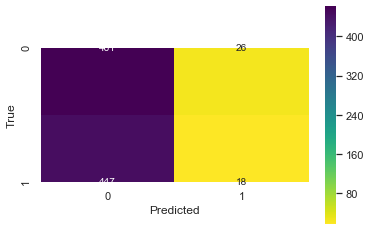

In [51]:
y_pred_test = model.predict(pool_test)

acc_test = accuracy_score(y_test, y_pred_test)
prec_test = precision_score(y_test, y_pred_test)
rec_test = recall_score(y_test, y_pred_test)
print(f'''Accuracy (test): {acc_test:.3f}
Precision (test): {prec_test:.3f}
Recall (test): {rec_test:.3f}''')

cm = confusion_matrix(y_test, y_pred_test)
ax = sns.heatmap(cm, cmap='viridis_r', annot=True, fmt='d', square=True)
ax.set_xlabel('Predicted')
ax.set_ylabel('True');

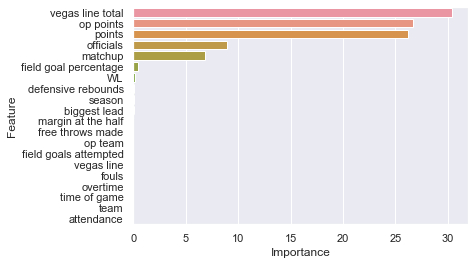

In [52]:
feat = model.feature_names_
imp = model.feature_importances_
df = pd.DataFrame({'Feature': feat, 'Importance': imp})
df = df.sort_values('Importance', ascending=False)[:20]
sns.barplot(x='Importance', y='Feature', data=df);

In [15]:
ta = stats.drop(['date', 'op team', 'op points', 'total points',
       'home away', 'season', 'vegas line', 'o/u margin', 'vegas line total',
       'ats margin', 'ats streak', 'conference west/east',
       'game number', 'margin', 'margin after the first', 'margin after the third',
       'margin at the half', 'matchup losses', 'matchup wins',
       'officials', 'ou streak', 'matchup', 'o/u', 'WL', 'time zone__C', 'time zone__E', 
       'time zone__M', 'time zone__P', 'division__Atlantic', 'division__Central', 'division__Northwest',
       'division__Pacific', 'division__Southeast', 'division__Southwest',
       'day__Friday', 'day__Monday', 'day__Saturday', 'day__Sunday',
       'day__Thursday', 'day__Tuesday', 'day__Wednesday'], axis=1, errors='ignore')
team_averages = ta.groupby(by='team', as_index=False).mean().sort_values('wins')
team_averages.reset_index(drop=True, inplace=True)
team_averages.head()

,team,points,assists,attendance,biggest lead,blocks,defensive rebounds,dpa,dps,fast break points,...,team rebounds,three pointers attempted,three pointers made,three pointer percentage,percentage of points from three pointers,time of game,times tied,turnovers,wins,win percentage
0,Supersonics,99.796680,20.912863,16504.116183,9.273859,4.058091,29.398340,1.039419,0.107884,14.116183,...,8.207469,16.377593,5.871369,5.798797,17.396763,135.000000,0.000000,14.564315,14.203320,53.751826
1,Timberwolves,100.947090,21.859788,16457.076720,9.937390,4.432099,31.048501,0.615079,0.123016,11.700176,...,8.442681,18.871252,6.494709,6.322601,18.968078,134.537037,3.916226,14.113757,14.767196,68.106640
2,Kings,102.088157,21.191451,16574.268923,9.765806,4.152271,31.165628,0.569679,0.510908,14.245770,...,8.708816,20.341051,7.263580,7.044043,21.132654,135.240427,3.880677,14.407836,15.061443,63.673589
3,Knicks,100.090199,20.329575,18685.123157,9.852559,4.258456,31.137901,0.141154,-0.052689,9.685169,...,8.274068,23.030356,8.121422,8.020295,24.061249,136.295750,3.692975,13.773634,16.080659,75.154874
4,Hornets,98.175758,21.307359,16716.219048,10.132468,5.019048,31.393074,0.292424,0.114935,11.404329,...,9.029437,20.623377,7.178355,7.136952,21.411247,133.326407,3.634632,12.970563,16.167100,71.388511


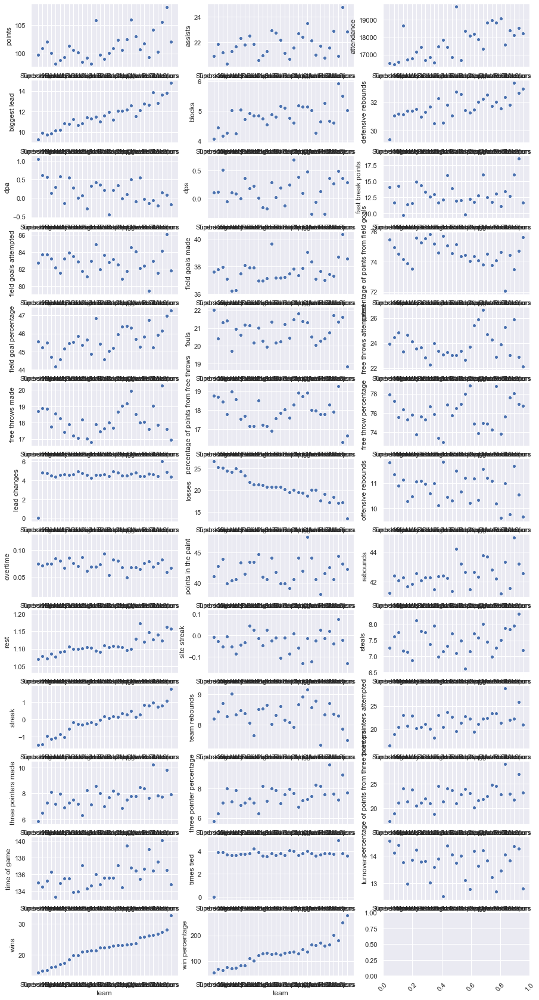

In [16]:
fig, axes = plt.subplots(13,3, figsize=(15,30))
for i, ax in enumerate(axes.flatten()):
        if i <= team_averages.shape[1]-2:
            g = sns.scatterplot(x='team', y=team_averages.columns[i+1], data=team_averages, ax = ax)
            plt.xticks(rotation=45)

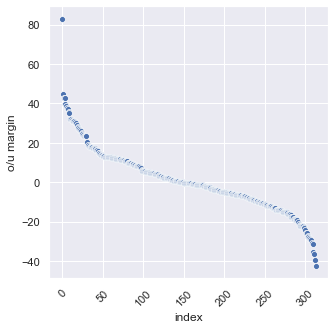

In [18]:
fig, axes = plt.subplots(1,1, figsize=(5,5))
g = sns.scatterplot(x='index', y='o/u margin', data=matchup_averages.reset_index())
g = plt.xticks(rotation=45)

In [35]:
#fig, axes = plt.subplots(20,3, figsize=(15,60))
#for i, ax in enumerate(axes.flatten()):
#        if i <= matchup_averages.shape[1]-2:
#            g = sns.scatterplot(x='index', y=matchup_averages.columns[i+1], data=matchup_averages.reset_index(), ax = ax)

In [29]:
ma = matchup_averages.copy()

In [30]:
scaler = StandardScaler()
train_X = scaler.fit_transform( train_X )
test_X = scaler.transform( test_X )

scaler = StandardScaler()
scaled_data = pd.DataFrame(scaler.fit_transform(ma), columns = ma.columns)
scaled_data.head()

ValueError: could not convert string to float: 'Rockets Wizards'

In [22]:
ma_x = matchup_averages.copy()

ma_y = ma_x['o/u margin class'].copy()

ma_x = ma_x.drop(['o/u', 'o/u margin', 'o/u margin class', 'dpa', 'dps'], axis=1, errors='ignore')

ma_y = ma_y[ma_x.index]

X_train, X_test, y_train, y_test = train_test_split(ma_x, ma_y, stratify=ma_y, random_state=66)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train, random_state=66)

scaler = StandardScaler()
pca = PCA(n_components=3)

X_scaled = pd.DataFrame(scaler.fit_transform(X_train.select_dtypes('number')))
X_pca = pca.fit_transform(X_scaled.select_dtypes('number'))
pca_df=pd.DataFrame(X_pca, columns=['PCA%i' % i for i in range(3)], index=X_scaled.index)

In [23]:
pca.explained_variance_ratio_

array([0.13204544, 0.12015376, 0.08649969])

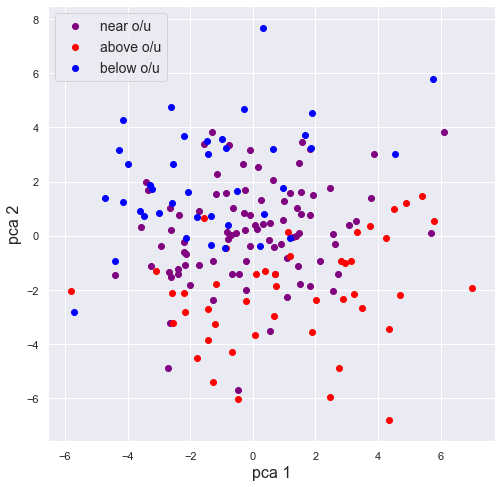

In [24]:
plt.figure(figsize = (8,8))

plt.scatter(X_pca[y_train==0,0],X_pca[y_train==0,1],c='purple',label='near o/u', alpha = 1)
plt.scatter(X_pca[y_train==1,0],X_pca[y_train==1,1],c='red',label='above o/u', alpha = 1)
plt.scatter(X_pca[y_train==-1,0],X_pca[y_train==-1,1],c='blue',label='below o/u', alpha = 1)

plt.legend(fontsize=14)
plt.xlabel("pca 1",fontsize=16)
plt.ylabel("pca 2",fontsize=16)

plt.show()

Text(0.5, 0.92, 'PCA on the iris data set')

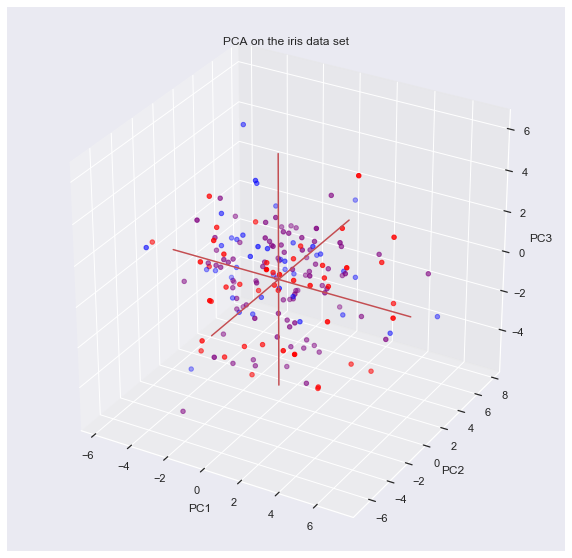

In [25]:
# Plot initialisation
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(pca_df['PCA0'], pca_df['PCA1'], pca_df['PCA2'], c=np.where(y_train == 1, 'red', (np.where(y_train == 0, 'purple', 'blue'))), cmap="Set2_r", s=20)
 
# make simple, bare axis lines through space:
xAxisLine = ((min(pca_df['PCA0']), max(pca_df['PCA0'])), (0, 0), (0,0))
ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
yAxisLine = ((0, 0), (min(pca_df['PCA1']), max(pca_df['PCA1'])), (0,0))
ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
zAxisLine = ((0, 0), (0,0), (min(pca_df['PCA2']), max(pca_df['PCA2'])))
ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')
 
# label the axes
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("PCA on the iris data set")
#plt.show()


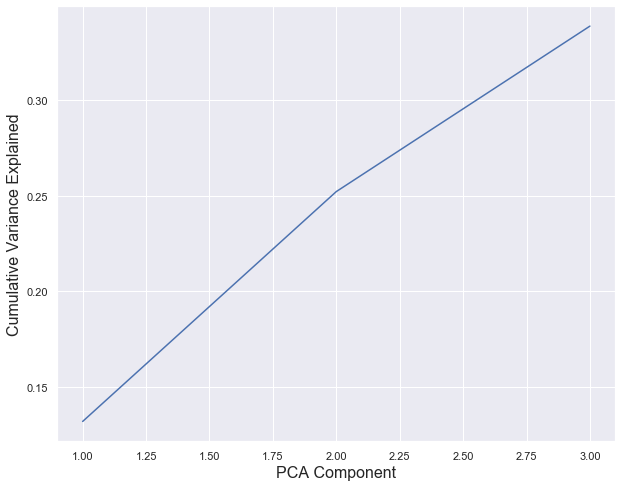

In [28]:
plt.figure(figsize=(10,8))

plt.plot(range(1,4),
        np.cumsum(pca.explained_variance_ratio_))

plt.xlabel("PCA Component", fontsize=16)
plt.ylabel("Cumulative Variance Explained", fontsize=16)

plt.show()

In [22]:
X = stats.copy()
#X = X[X.season == 2017]

y = X['o/u'].copy()

X = X.drop(['o/u'], axis=1, errors='ignore')

y = y[X.index]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, random_state=0)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train, random_state=0)

In [23]:
y_train.value_counts()

1    10270
0    10073
Name: o/u, dtype: int64

In [24]:
scaler = StandardScaler()
pca = PCA(n_components=75)

X_scaled = pd.DataFrame(scaler.fit_transform(X_train.select_dtypes('number')))
X_pca = pca.fit_transform(X_scaled.select_dtypes('number'))

In [25]:
pca.explained_variance_ratio_

array([1.20337026e-01, 8.18945565e-02, 6.71440235e-02, 5.07959339e-02,
       4.89695359e-02, 4.51469133e-02, 3.85679176e-02, 3.15637948e-02,
       2.84618409e-02, 2.59677307e-02, 2.36406445e-02, 2.15927458e-02,
       1.99161030e-02, 1.86517084e-02, 1.82421384e-02, 1.76924134e-02,
       1.71980602e-02, 1.64487240e-02, 1.64059197e-02, 1.59002311e-02,
       1.58036176e-02, 1.54837667e-02, 1.49701527e-02, 1.49169380e-02,
       1.39406937e-02, 1.37210174e-02, 1.34089069e-02, 1.32060695e-02,
       1.20368085e-02, 1.19218246e-02, 1.07618487e-02, 1.04857308e-02,
       1.02080542e-02, 1.00667902e-02, 8.80765861e-03, 8.40910008e-03,
       7.95444995e-03, 7.06987037e-03, 6.58408914e-03, 5.91491379e-03,
       5.60874595e-03, 5.20859802e-03, 4.81605900e-03, 4.63535420e-03,
       4.31029649e-03, 4.11239556e-03, 3.82300121e-03, 3.09550485e-03,
       2.48572924e-03, 2.38576990e-03, 2.18867714e-03, 2.14034473e-03,
       1.71971134e-03, 1.38702202e-03, 1.32667242e-03, 2.27188487e-04,
      

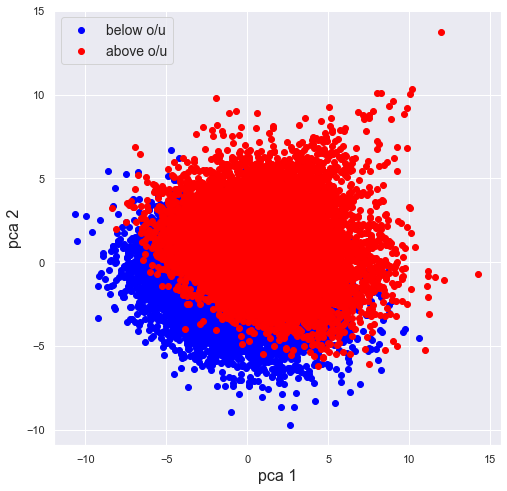

In [26]:
plt.figure(figsize = (8,8))

plt.scatter(X_pca[y_train==0,0],X_pca[y_train==0,1],c='blue',label='below o/u', alpha = 1)
plt.scatter(X_pca[y_train==1,0],X_pca[y_train==1,1],c='red',label='above o/u', alpha = 1)

plt.legend(fontsize=14)
plt.xlabel("pca 1",fontsize=16)
plt.ylabel("pca 2",fontsize=16)

plt.show()

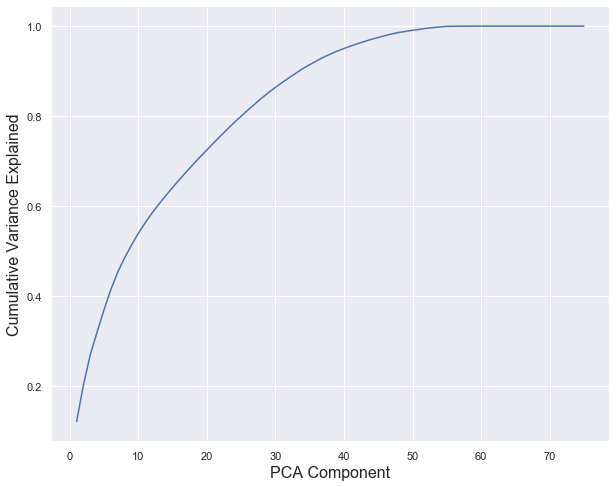

In [27]:
plt.figure(figsize=(10,8))

plt.plot(range(1,76),
        np.cumsum(pca.explained_variance_ratio_))

plt.xlabel("PCA Component", fontsize=16)
plt.ylabel("Cumulative Variance Explained", fontsize=16)

plt.show()

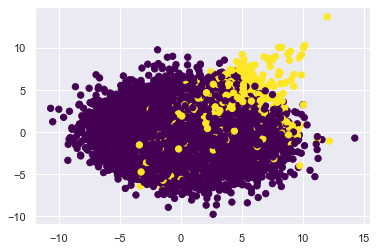

In [28]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=2).fit(X_pca)
labels = gmm.predict(X_pca)
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=labels, s=40, cmap='viridis');
probs = gmm.predict_proba(X_pca)
# print(probs[:5].round(3))

In [60]:
#drop features not available at the start of game or season
S = stats.copy()
S = S.drop(['points', 'op points', 'total points', 'o/u margin',
       'assists', 'ats margin', 'ats streak', 'biggest lead',
       'blocks', 'defensive rebounds', 'dpa', 'dps',
       'fast break points', 'field goals attempted', 'field goals made',
       'percentage of points from field goals', 'field goal percentage',
       'fouls', 'free throws attempted', 'free throws made',
       'percentage of points from free throws', 'free throw percentage',
       'lead changes', 'losses', 'margin',
       'margin after the first', 'margin after the third',
       'margin at the half', 'matchup losses', 'matchup wins',
       'offensive rebounds', 'ou streak', 'overtime',
       'points in the paint', 'rebounds', 'rest', 'site streak', 'steals',
       'streak', 'team rebounds', 'three pointers attempted',
       'three pointers made', 'three pointer percentage',
       'percentage of points from three pointers', 'time of game',
       'times tied', 'turnovers', 'wins', 'win percentage', 'o/u',
       'WL',], axis=1, errors='ignore')

#dont drop those features
G = stats.copy()
G = G.drop(['o/u', 'o/u margin', 'dpa', 'dps', 'total points', 'vegas line total', 'points', 'op points'], axis=1, errors='ignore')

X_train, X_test, y_train, y_test = train_test_split(G, y, stratify=y, random_state=420)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, stratify=y_train, random_state=420)

In [61]:
cat_feat_ind = (X_train.dtypes == 'object').nonzero()[0]
pool_train = Pool(X_train, y_train, cat_features=cat_feat_ind)
pool_val = Pool(X_val, y_val, cat_features=cat_feat_ind)
pool_test = Pool(X_test, y_test, cat_features=cat_feat_ind)

n = y_train.value_counts()
model = CatBoostClassifier(learning_rate=.03,
                           iterations=250,
                           early_stopping_rounds=100,
                           class_weights=[1, 1],
                           verbose=False,
                           random_state=0)
model.fit(pool_train, eval_set=pool_val, plot=True);

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Accuracy (test): 0.929
Precision (test): 0.929
Recall (test): 0.931


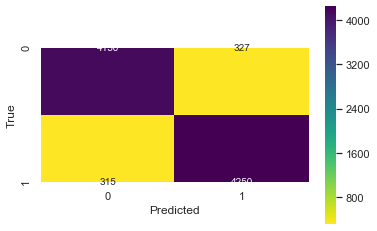

In [62]:
y_pred_test = model.predict(pool_test)

acc_test = accuracy_score(y_test, y_pred_test)
prec_test = precision_score(y_test, y_pred_test)
rec_test = recall_score(y_test, y_pred_test)
print(f'''Accuracy (test): {acc_test:.3f}
Precision (test): {prec_test:.3f}
Recall (test): {rec_test:.3f}''')

cm = confusion_matrix(y_test, y_pred_test)
ax = sns.heatmap(cm, cmap='viridis_r', annot=True, fmt='d', square=True)
ax.set_xlabel('Predicted')
ax.set_ylabel('True');

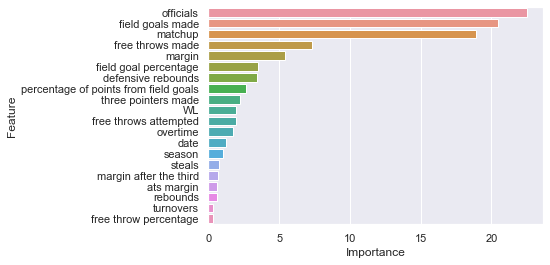

In [63]:
feat = model.feature_names_
imp = model.feature_importances_
df = pd.DataFrame({'Feature': feat, 'Importance': imp})
df = df.sort_values('Importance', ascending=False)[:20]
sns.barplot(x='Importance', y='Feature', data=df);

In [35]:
#fig, ax = plt.subplots(1,1, figsize=(15,10))
#g = sns.boxplot(x='abbreviation', y='FinalScore_VegasLine', data=nba_games_15_16)
#g = sns.scatterplot(x=nba_games_15_16.index, y='FinalScore_VegasLine', data=nba_games_15_16)

In [ ]:
#fig, ax = plt.subplots(1,1, figsize=(15,10))
#g = sns.boxplot(x='abbreviation', y='FinalScore_VegasLine', data=nba_games_15_16)

In [ ]:
#nba_games_15_16.columns

In [ ]:
#x = nba_games_15_16.copy()

In [ ]:
#drop columns that are >l.8l correlated or not useful like state or team id
#cols_to_keep = ['MATCHUP', 'WL', 'MIN', 'PTS', 'FGA',
#       'FG_PCT', 'FG3M', 'FG3A', 'FG3_PCT', 'FTM', 'FT_PCT', 'OREB',
#       'REB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'FinalScore_VegasLine', 'HOMEAWAY', 'O/U']
#x = x[cols_to_keep]

In [ ]:
#x.set_index('MATCHUP', inplace=True)
#x.head()

In [ ]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import export_graphviz

dt = DecisionTreeRegressor()

# Grid search meta parameters
param_grid = dict(min_samples_leaf=np.array([1,5,10,50,100,200]), max_depth=np.array([2,4,6,8,10]))
kfold = KFold(n_splits=10, random_state=seed)
grid = GridSearchCV(estimator=dt, param_grid=param_grid, cv=kfold, scoring='neg_mean_squared_error')
grid_result = grid.fit(X, Y)

# Evaluate best model
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
dt = DecisionTreeRegressor(**grid_result.best_params_)
scores = cross_val_score(dt, X, Y, cv=kfold, scoring='neg_mean_squared_error')
print('CART')
print(scores.mean())

# Serialize tree structure for investigation
dt.fit(X, Y)
output_file = './auto_mpg.graphviz'
export_graphviz(dt, out_file=output_file, feature_names = X.columns)
print("Wrote output to " + output_file)

In [ ]:
#fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(20,30))
#for i, ax in enumerate(axes.flatten()):
#    sns.barplot(x='TEAM_ABBREVIATION', y=x.columns[i+1], data=x, hue='O/U', ax=ax)

In [ ]:
from sklearn import preprocessing

scaler = preprocessing.StandardScaler()

scaler.fit(x)
x_scaled_array = scaler.transform(x)
x_scaled = pd.DataFrame(x_scaled_array, columns = x.columns)

x_scaled.shape

In [ ]:
from sklearn.cluster import KMeans

nclusters = 3 # this is the k in kmeans
seed = 0

km = KMeans(n_clusters=nclusters, random_state=seed)
km.fit(x_scaled)

# predict the cluster for each data point
y_cluster_kmeans = km.predict(x_scaled)
y_cluster_kmeans

In [ ]:
from sklearn import metrics
score = metrics.silhouette_score(x_scaled, y_cluster_kmeans)
score

In [ ]:
scores = metrics.silhouette_samples(x_scaled, y_cluster_kmeans)
sns.distplot(scores);

In [ ]:
from sklearn.decomposition import PCA

ndimensions = 2

pca = PCA(n_components=ndimensions, random_state=seed)
pca.fit(x_scaled)
x_pca_array = pca.transform(x_scaled)
x_pca = pd.DataFrame(x_pca_array, columns=['PC1','PC2']) # PC=principal component
x_pca.shape

In [ ]:
y_id_array = pd.Categorical(x.index).codes

df_plot = x_pca.copy()
df_plot['ClusterKmeans'] = y_cluster_kmeans
df_plot['O/U'] = y_id_array # also add actual labels so we can use it in later plots
df_plot.sample(5)

In [ ]:
def plotData(df, groupby):
    "make a scatterplot of the first two principal components of the data, colored by the groupby field"
    
    # make a figure with just one subplot.
    # you can specify multiple subplots in a figure, 
    # in which case ax would be an array of axes,
    # but in this case it'll just be a single axis object.
    fig, ax = plt.subplots(figsize = (7,7))

    # color map
    cmap = mpl.cm.get_cmap('prism')

    # we can use pandas to plot each cluster on the same graph.
    # see http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.plot.html
    for i, cluster in df.groupby(groupby):
        cluster.plot(ax = ax, # need to pass this so all scatterplots are on same graph
                     kind = 'scatter', 
                     x = 'PC1', y = 'PC2',
                     color = cmap(i/(nclusters-1)), # cmap maps a number to a color
                     label = "%s %i" % (groupby, i), 
                     s=30) # dot size
    ax.grid()
    ax.axhline(0, color='black')
    ax.axvline(0, color='black')
    ax.set_title("Principal Components Analysis (PCA) of Iris Dataset");

In [ ]:
plotData(df_plot, 'ClusterKmeans')

In [ ]:
from sklearn.mixture import GaussianMixture

gmm = GaussianMixture(n_components=3)
gmm.fit(x_scaled)

# predict the cluster for each data point
y_cluster_gmm = gmm.predict(x_scaled)
y_cluster_gmm


In [ ]:
df_plot['ClusterGMM'] = y_cluster_gmm
plotData(df_plot, 'ClusterGMM')